In [ ]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [ ]:
%cd yolov5

/content/yolov5


In [ ]:
pip install -r requirements.txt

In [ ]:
%cd /content
!curl -L "https://app.roboflow.com/ds/V6KXYicyNI?key=j4lU9cHZ59" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   910  100   910    0     0   2743      0 --:--:-- --:--:-- --:--:--  2749
100 17.8M  100 17.8M    0     0  15.5M      0  0:00:01  0:00:01 --:--:-- 36.5M
Archive:  roboflow.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/Image_100_jpg.rf.4f4f0f3d0e2d7ccde6c71fcdc031bf8e.jpg  
 extracting: test/images/Image_123_jpg.rf.1fda32029273a655f7bf1e32fd69c1e9.jpg  
 extracting: test/images/Image_127_jpg.rf.fb218e153374c89ccfe6e922e482b26c.jpg  
 extracting: test/images/Image_131_png.rf.652f814ae6b22d166f9dd6f496c84b6f.jpg  
 extracting: test/images/Image_134_jpg.rf.0ec5b2dc8b31e1ae3272dc5c6956cd8b.jpg  
 extracting: test/images/Image_13_png.rf.e11b5d77c545be50750e20315db31b4a.jpg  
 extract

In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 7
names: ['Bunga-Iris-Biru', 'Bunga-Iris-Kuning', 'Bunga-Iris-Layu', 'Bunga-Iris-Merah', 'Bunga-Iris-Pink', 'Bunga-Iris-Putih', 'Bunga-Iris-Ungu']

roboflow:
  workspace: nadia-mwbco
  project: deteksi-bunga-iris-ungu
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/nadia-mwbco/deteksi-bunga-iris-ungu/dataset/1

In [ ]:
%cd /content/yolov5/
!python train.py --img 416 --batch 8 --epochs 80 --data '../data.yaml' --weights yolov5s.pt --name yolov5_result --cache

/content/yolov5
2024-07-06 13:13:43.832739: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-06 13:13:43.832809: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-06 13:13:43.834513: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=80, batch_size=8, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single

- end training

evaluasi

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

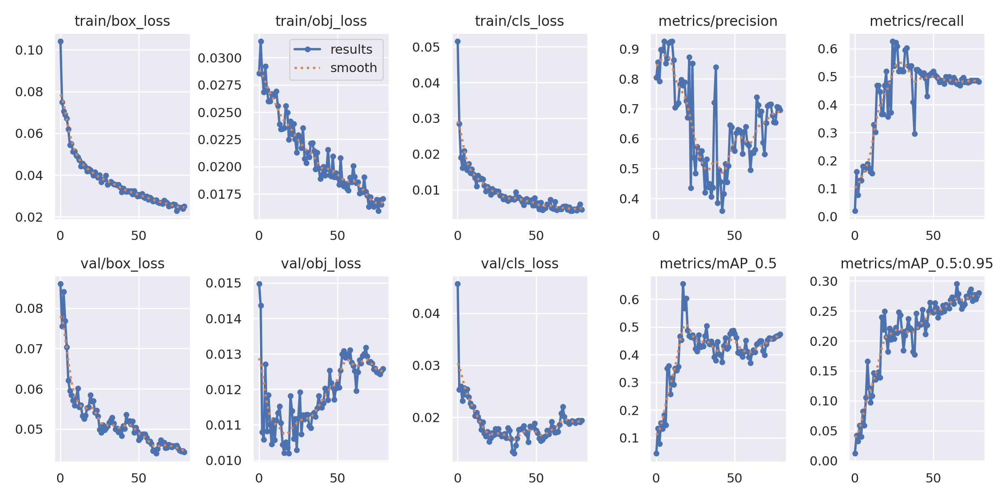

In [ ]:
from IPython.display import Image, clear_output #untuk menampilkan gambar
from utils.plots import plot_results #plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5_result/results.png', width=1000) #melihat results.png

GROUND TRUTH DISPLAY DATA:


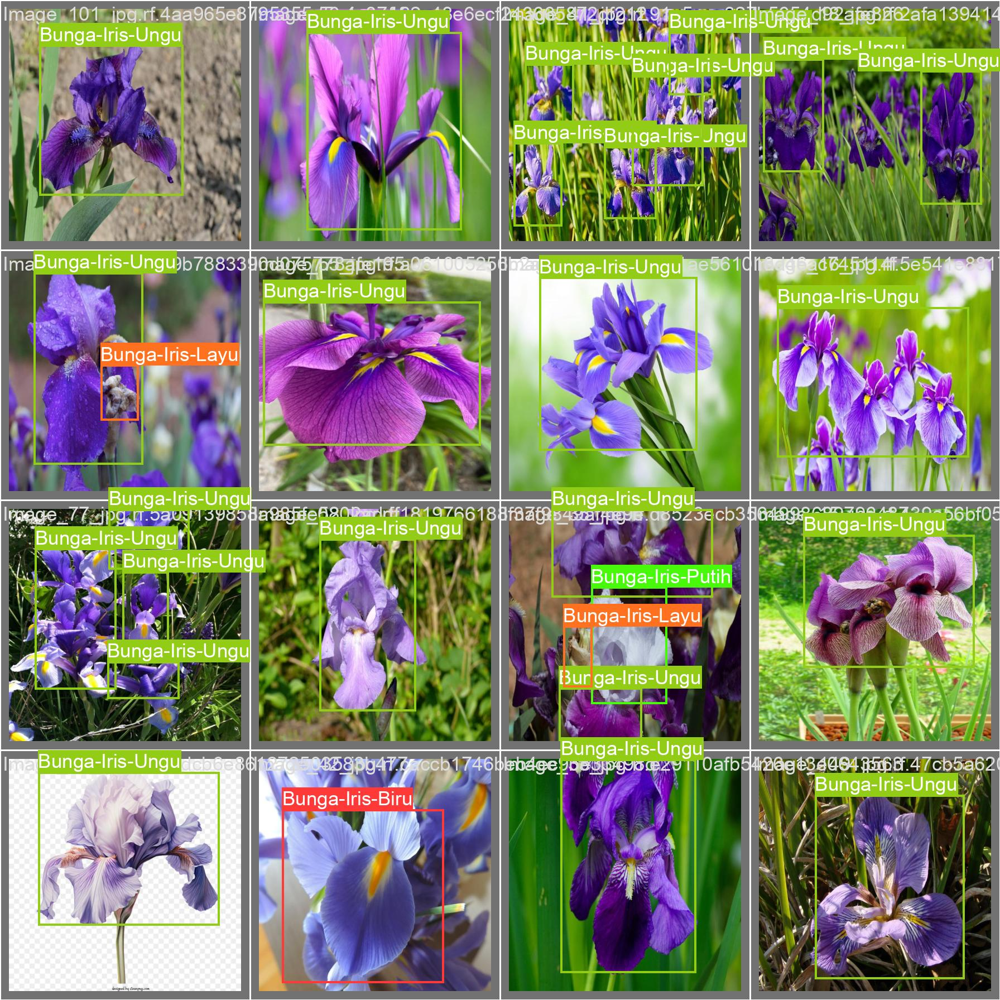

In [ ]:
#pertama tampilkan data dasar yang sebenarnya
#memastikan yang sudah di labeling pada roboflow
print("GROUND TRUTH DISPLAY DATA:")
Image (filename= '/content/yolov5/runs/train/yolov5_result/val_batch0_labels.jpg', width= 900)

Testing

In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5_result/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
detect: weights=['runs/train/yolov5_result/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-335-g40f490d9 Python-3.10.12 torch-2.3.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
image 1/15 /content/test/images/Image_100_jpg.rf.4f4f0f3d0e2d7ccde6c71fcdc031bf8e.jpg: 416x416 1 Bunga-Iris-Biru, 1 Bunga-Iris-Ungu, 206.5ms
image 2/15 /content/test/images/Image_123_jpg.rf.1fda32029273a655f7bf1e32fd69c1e9.jpg: 416x416 12 Bunga-Iris-Ungus, 207.4ms
image 3/15 /content/test/images/Image_127_jpg.rf.fb218e153374c89ccfe

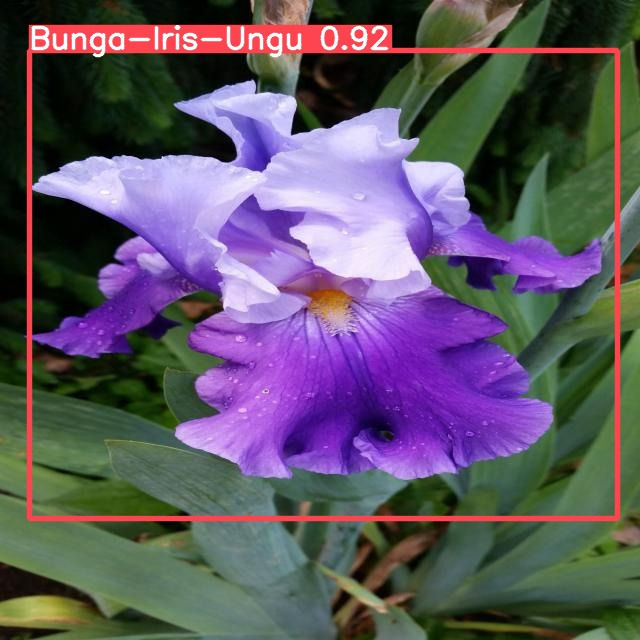

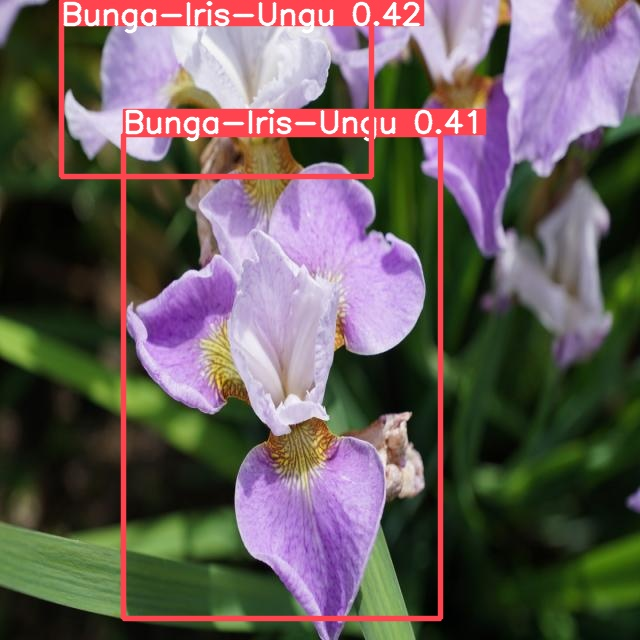

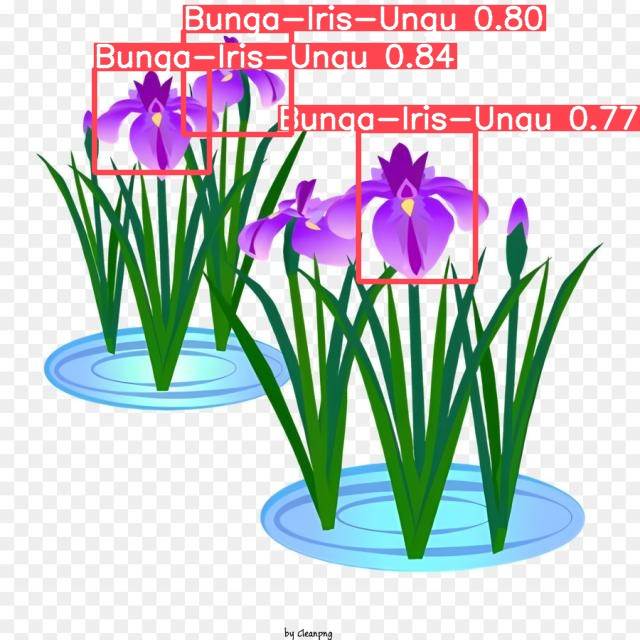

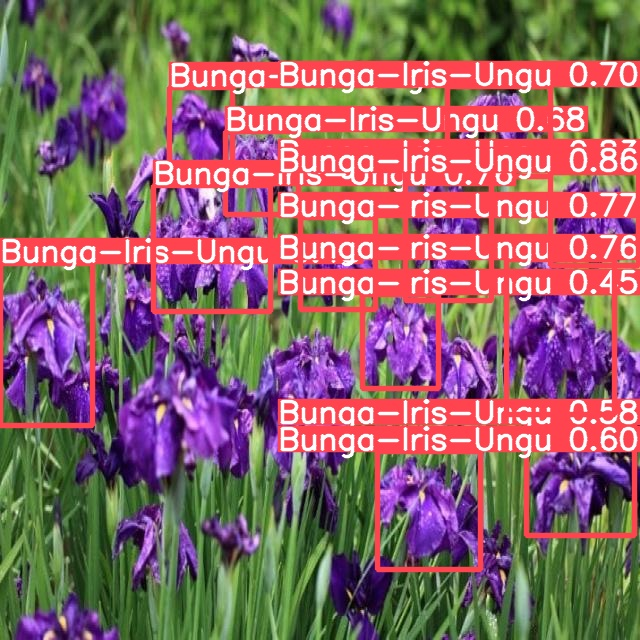

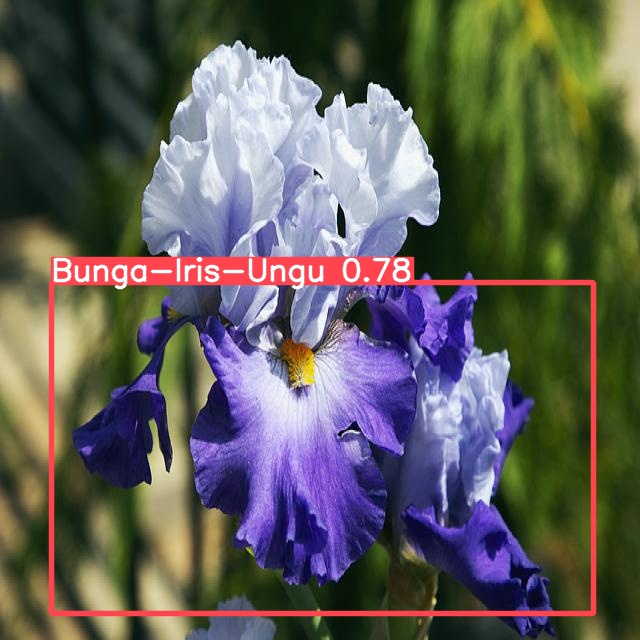

...

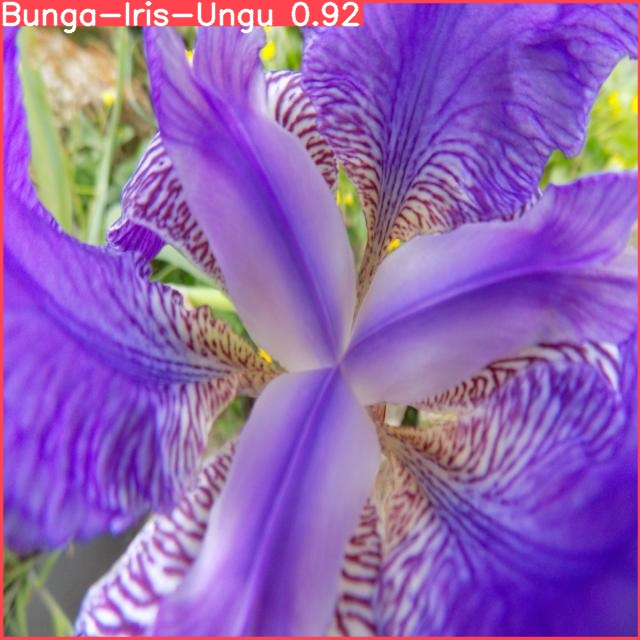

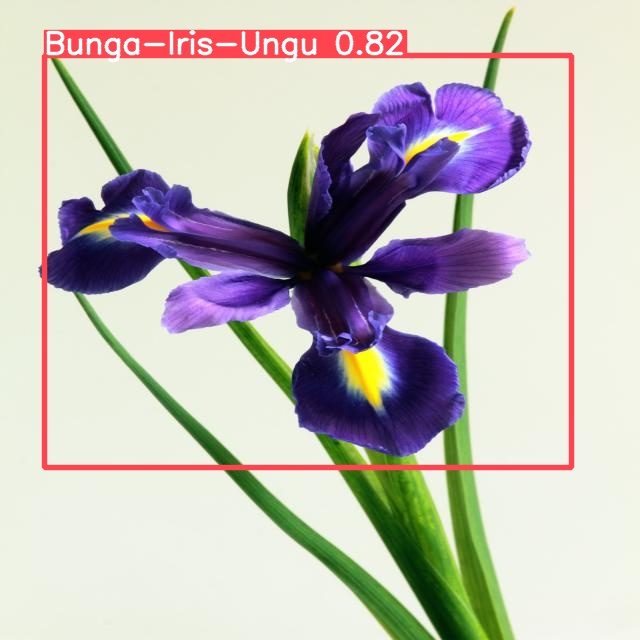

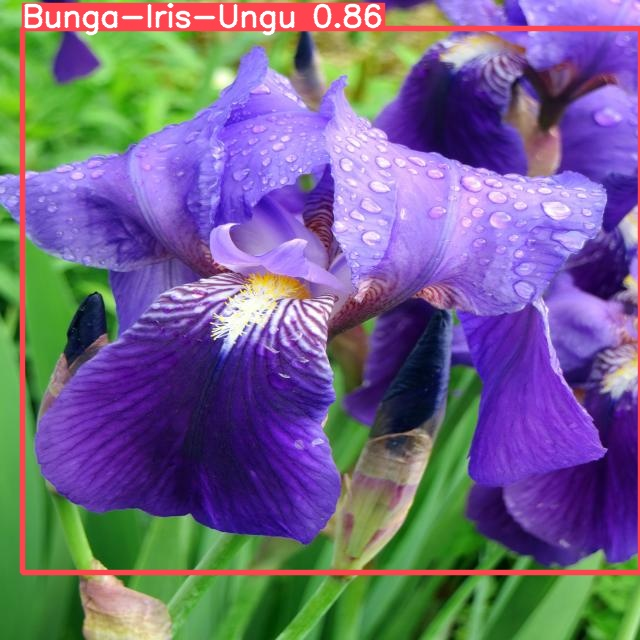

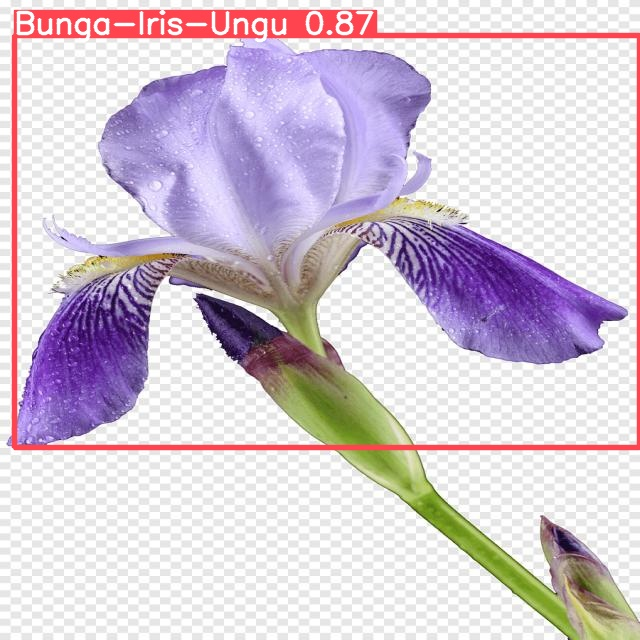

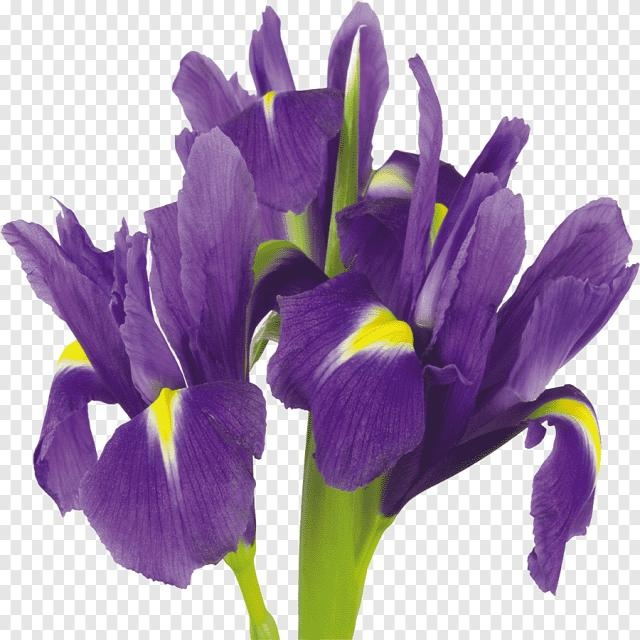

In [ ]:
#menampilkan inferensi pada semua gambar yang diuji
#ini terlihat jauh lebih baik dengan pelatihan yang lebih lama di atas
from IPython.display import Image, clear_output #menampilkan gambar
import glob
from IPython.display import Image, display

for imageName in glob.glob ('/content/yolov5/runs/detect/exp2/*.jpg'): #dengan asumsi jpg
    display(Image(filename=imageName, width=400))
    print("\n")